# Graph learning

The objective of this notebook is to present different analysis methods for graph.
They are implementations of algorithms presented on the UTC master lecture on graph learning (AOS6) taught by Jean-Benoist Leger. It is not a global project but more a compilation of homeworks.


# Part2 Random graph generation

The goal of this part is to generate random graphs and to study their properties.

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import networkx as nx
import scipy

np.random.seed(0)

### Erdos–Renyi model 
It is the easiest model to make a random graph. The probability to have a link between nodes is the same for all nodes. The probability p is the only parameter of the model. The graph is generated by a Bernoulli process.

In [2]:
def ER(n, p):    
    return scipy.stats.bernoulli.rvs(p, loc=0, size=n*n, random_state=None).reshape((n, n))   

In [3]:
def size_i_bigest_cc_ER_model(n, p, nb_estim=50, i=1):
    j = i - 1
    s_bigest_cc = np.zeros(nb_estim)    
    for i in range(nb_estim):        
        G = nx.from_numpy_array(ER(n, p))
        l = sorted(nx.connected_components(G), key=len, reverse=True)
        if len(l) > j:
            s_bigest_cc[i] = len(l[j])
        else:
            s_bigest_cc[i] = 0
    return s_bigest_cc.mean()

def number_of_cc_ER_model(n, p, nb_estim=20):    
    number_cc = np.zeros(nb_estim)    
    for i in range(nb_estim):        
        G = nx.from_numpy_array(ER(n, p))
        number_cc[i] = nx.number_connected_components(G)        
    return number_cc.mean()

These functions will be useful to analyze the model.

The `nb_estim` is used to have an robust estimation of the size of the i-th biggest cc (connected components, i.e. group of nodes that are linked) or the number of cc. With one sample, it is not a robust estimation (variance is high). The higger nb_estim is, the more the figure will be smooth.

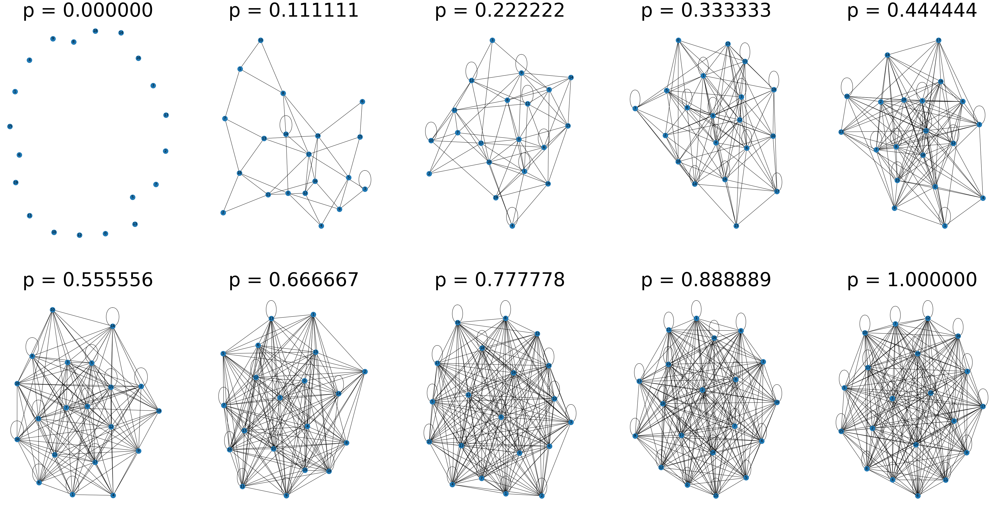

In [27]:
n=20
p_range = np.linspace(0, 1, 10)

plt.figure(figsize=(60, 30))
for i, p in enumerate(p_range):
    plt.subplot(2, 5, 1+i)
    G = nx.from_numpy_array(ER(n, p))
    nx.draw(G, with_labels=True)   
    plt.title(f"p = {p:f}", fontsize=64)
    
plt.show()

We see that for p>=0.2 the graph is composed of one big cc. The higher p is the more the graph is densely connected.

We see that for p=0 there are the maximum number of cc (the number of nodes). What is happening?


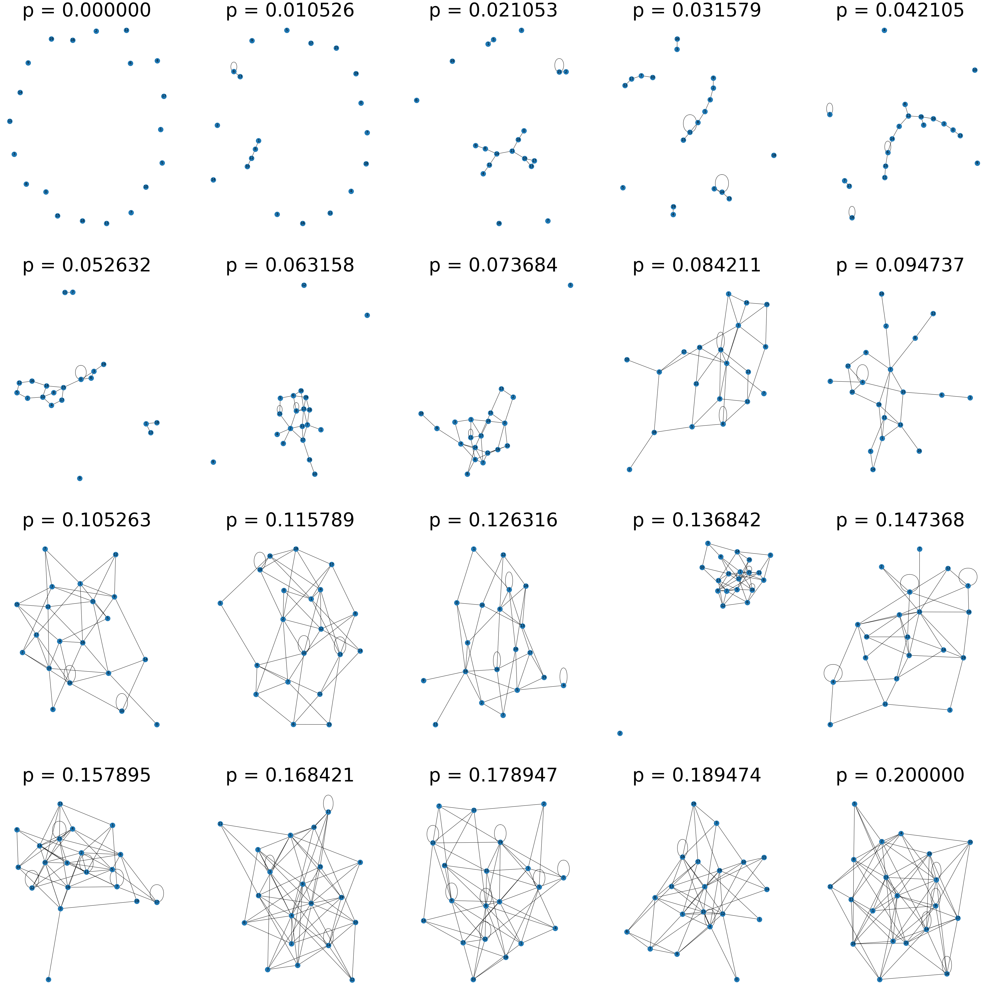

In [28]:
n=20
p_range = np.linspace(0, 0.2, 20)

plt.figure(figsize=(60, 60))
for i, p in enumerate(p_range):
    plt.subplot(4, 5, 1+i)
    G = nx.from_numpy_array(ER(n, p))
    nx.draw(G, with_labels=True)   
    plt.title(f"p = {p:f}", fontsize=64)
    
plt.show()

With a higher p, the nodes start to be connected. The number of cc decreases and size of cc are increasing. At the end, there is only one cc with max size (all nodes are connected and part of the only cc). This phenomenon is called the percolation.

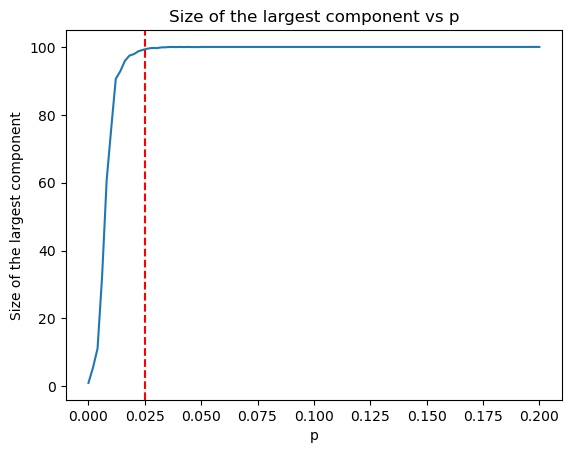

In [6]:
n = 100
lspace = np.linspace(0, 0.2, 100)
l = [size_i_bigest_cc_ER_model(n, p, nb_estim=20) for p in lspace]

plt.plot(lspace, l)
# plot a vertical line at p=1/n
plt.axvline(0.025, color='r', linestyle='--')
plt.xlabel('p')
plt.ylabel('Size of the largest component')
plt.title('Size of the largest component vs p')
plt.show()

We try to locate the percolation. As seeWe observe that it is located before 0.025. We can try to have a more precise estimation.

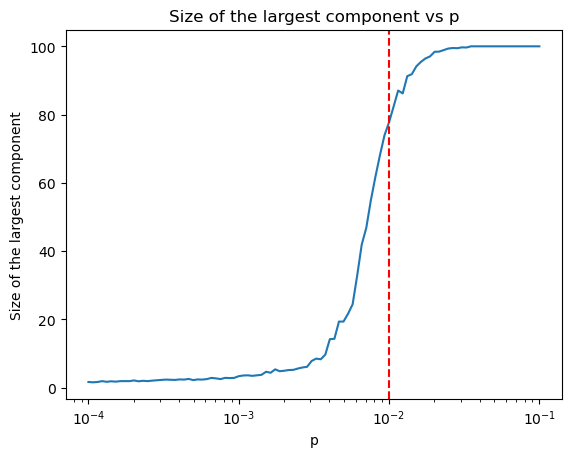

In [7]:
n = 100
lspace = np.logspace(-4, -1, 100)
l = [size_i_bigest_cc_ER_model(n, p, nb_estim=20) for p in lspace]

plt.plot(lspace, l)
plt.axvline(1/n, color='r', linestyle='--')
plt.xlabel('p')
plt.xscale('log')
plt.ylabel('Size of the largest component')
plt.title('Size of the largest component vs p')
plt.show()

We see that the percolation is located the just before 0.01=1/n (n is the number of nodes and here n=100)

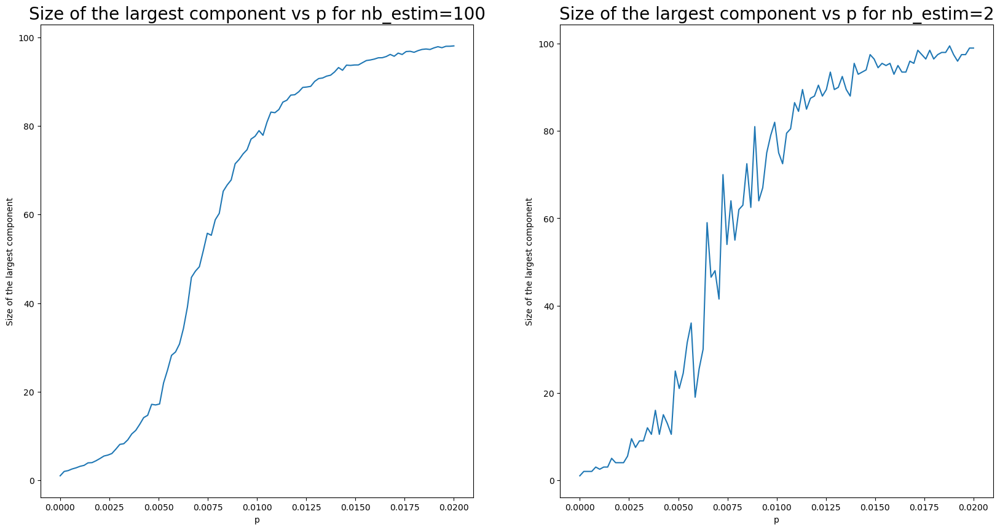

In [8]:
n = 100
lspace = np.linspace(0, 0.02, 100)

l = [size_i_bigest_cc_ER_model(n, p, nb_estim=100) for p in lspace]

plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.plot(lspace, l)
plt.xlabel('p')
plt.ylabel('Size of the largest component')
plt.title('Size of the largest component vs p for nb_estim=100', fontsize=20)

l = [size_i_bigest_cc_ER_model(n, p, nb_estim=2) for p in lspace]

plt.subplot(1, 2, 2)
plt.plot(lspace, l)
plt.xlabel('p')
plt.ylabel('Size of the largest component')
plt.title('Size of the largest component vs p for nb_estim=2', fontsize=20)
plt.show()

In the case we estimate give an estimation of the size of the largest cc with one sample or more. It is clearly visible that this is not the right way to with a `nb_estim` small because there is a high variance and the curve won't be smooth.

An observation we can make is that the percolation is located close to 1/n=1/100=0.01. Let's verify if it can be generalized with a new value of n.

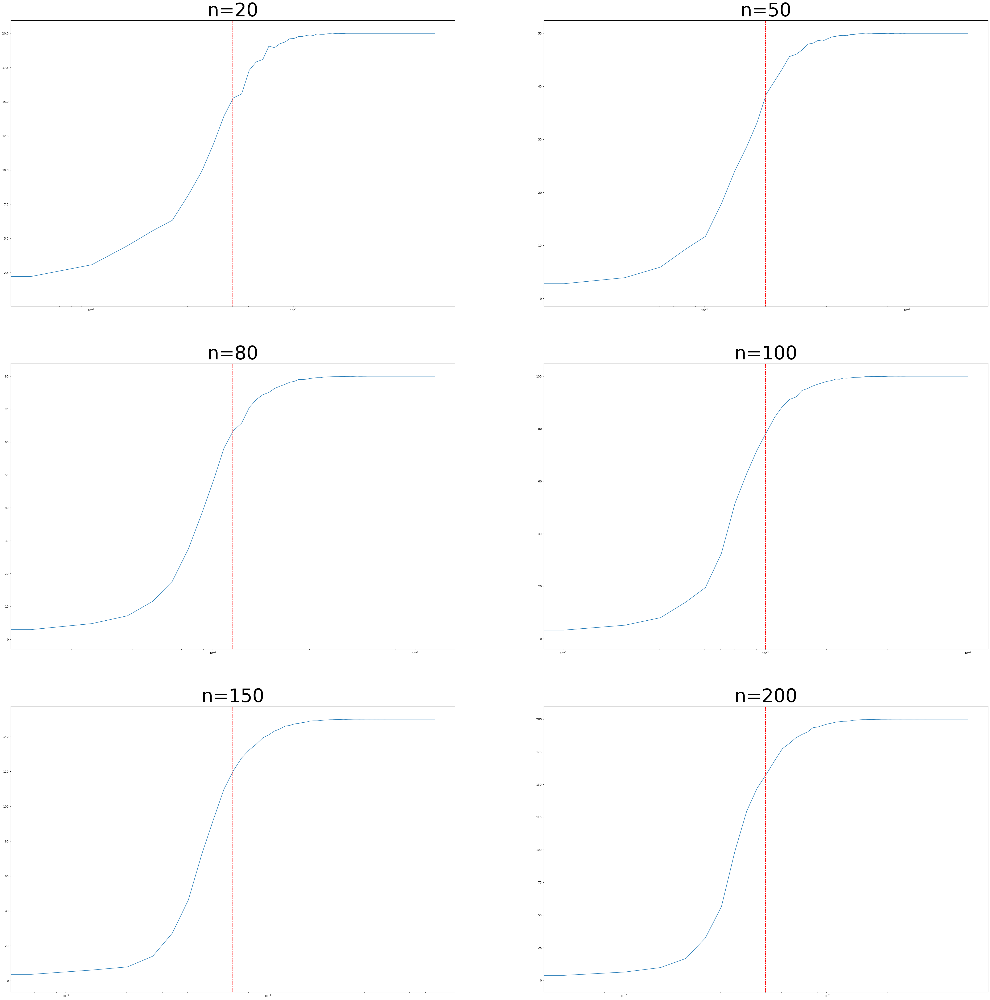

In [9]:
n = [20, 50, 80, 100, 150, 200]

plt.figure(figsize=(60, 60))
for id, i in enumerate(n):    
    lspace = np.linspace(0, 10/i, 100)
    l = [size_i_bigest_cc_ER_model(i, p, nb_estim=80) for p in lspace]

    plt.subplot(3, 2, 1+id)
    plt.plot(lspace, l, label=f'n={i}')
    plt.axvline(1/i, color='r', linestyle='--')
    plt.xscale('log')
    plt.title(f'n={i}', fontsize=64)


The relation just before 1/n, for the percolation  is verified.

<Figure size 2000x1000 with 0 Axes>

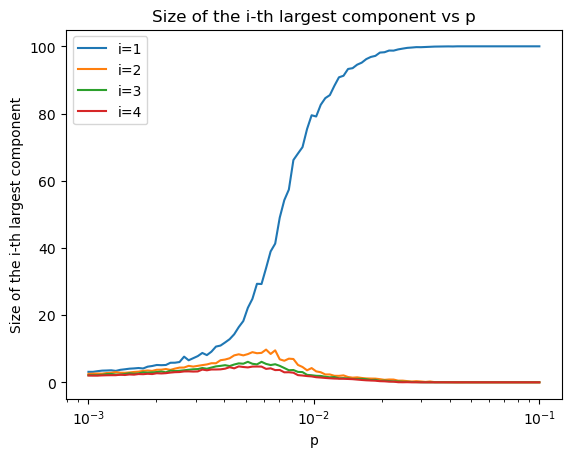

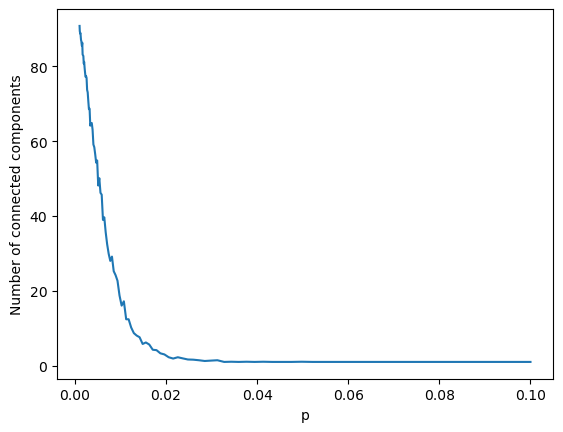

In [10]:
n=100
lspace = np.logspace(-3, -1, 100)

l = [size_i_bigest_cc_ER_model(n, p) for p in lspace]
l1 = [size_i_bigest_cc_ER_model(n, p, nb_estim=50, i=1) for p in lspace]
l2 = [size_i_bigest_cc_ER_model(n, p, nb_estim=50, i=2) for p in lspace]
l3 = [size_i_bigest_cc_ER_model(n, p, nb_estim=50, i=3) for p in lspace]
l4 = [size_i_bigest_cc_ER_model(n, p, nb_estim=50, i=4) for p in lspace]
    
plt.figure(figsize=(20, 10))
plt.figure(121)    
plt.plot(lspace, l1)
plt.plot(lspace, l2)
plt.plot(lspace, l3)
plt.plot(lspace, l4)
plt.xlabel('p')
plt.xscale('log')
plt.ylabel('Size of the i-th largest component')
plt.title('Size of the i-th largest component vs p')
plt.legend(['i=1', 'i=2', 'i=3', 'i=4'])

l = [number_of_cc_ER_model(n, p) for p in lspace]
plt.figure(122)
plt.plot(lspace, l)
plt.xlabel('p')
plt.ylabel('Number of connected components')

plt.show()


We se that the higher p is, the bigger the size of the biggest cc become. This reach a point were there is just one big cc with all edges connected so the max size of n for the biggest cc. At the beginning, it is the same for the size of the 2nd, 3rd and 4th biggest cc, their sizes are increasing until the percolation. Then they are in a way absorb by th biggest cc.

### LPM

The LPM is a random graph generator. First a laten variable is given. It can be seen as a spatial coordinate of the nodes. Then the probability of link between 2 nodes is given by a parametrized kernel function of the distance between the latent variables of the nodes. The link is generated with this probability from a bernoulli experience.


In [11]:
def kernel(a, b, x, y):
    return scipy.special.expit(a + b*np.linalg.norm(x - y))    

def P_X_Z_i_Z_j(Z, n, a = 1, b = 1):
    A = np.zeros((n, n))
    for i, Z_i in enumerate(Z):
        for j, Z_j in enumerate(Z):
            A[i,j] = scipy.stats.bernoulli(kernel(a, b, Z_i, Z_j)).rvs(1)[0]
    return A

We will work in 2 dimensions, so we can plot the nodes and have their spacial visualization.

Z, a centred-reduced multi-normal variable, will be our a latent variable. 

Z[i] corresponds to (x,y) coordinate for node i. If two nodes are close there is a high probability that the will be linked. Obviously self loop are very frequent.

Parameters a and b that are used in the kernel function are the parameters of the LPM. We will tune them to see te impact on the graph.

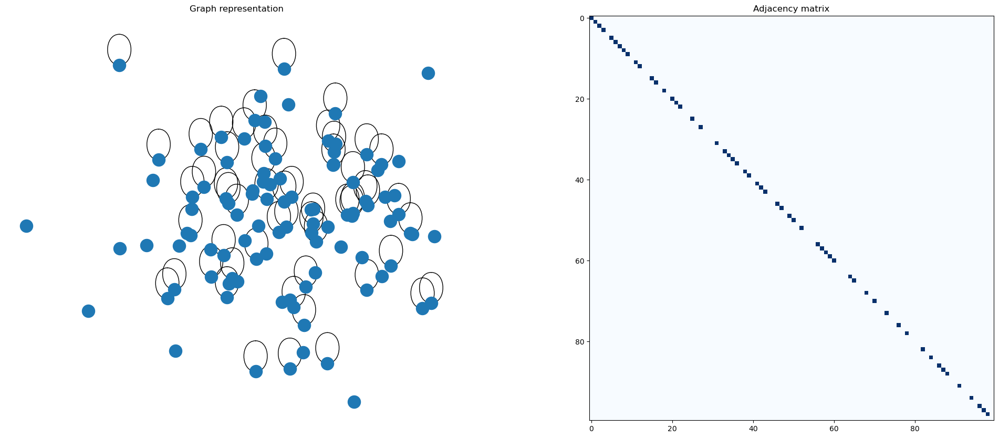

In [12]:
d= 2
n = 100

Z = scipy.stats.multivariate_normal(np.zeros(d), np.eye(d)).rvs(n)

a,b = 0, -1000
A = P_X_Z_i_Z_j(Z, n, a , b)

plt.figure(figsize=(25,10))
plt.subplot(121)
nx.draw(nx.from_numpy_array(A), pos=Z)
plt.title('Graph representation')

plt.subplot(122)
plt.imshow(A, cmap='Blues')
plt.title('Adjacency matrix')
plt.show()

We see that there are only self loops. Let's plot the kernel function for these value of a and b to explain it.

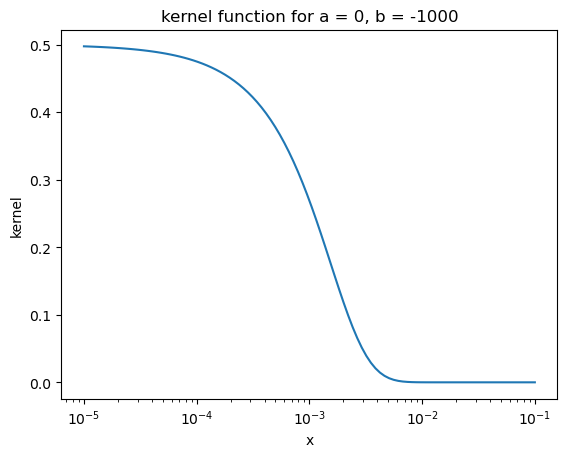

In [13]:
xx = np.logspace(-5,-1,100)
y = [kernel(a, b, 0, x) for x in xx]

plt.plot(xx,y)
plt.xscale('log')
plt.xlabel('x')
plt.ylabel('kernel')
plt.title('kernel function for a = 0, b = -1000')
plt.show()

The closer the nodes, the higher the chance are to have a link between them. Self loops are highly probable because the distance is 0. Thus the probability of an self loop is p=expit(a). 

Here with b=-100 and a=0, thus p=0.5 for self loops. For other distances p is close to 0. That explains why on adjacency matrix representation, there are just points on the diagonal (self loops). The number of self loop divided by the number of edges is an estimator of p=expit(a) and we will se that it is close to 0.5.

In [14]:
p = A.sum()/n
print('Number of self loop divided by the number of edges = ', p)

Number of self loop divided by the number of edges =  0.56


Let take diffrent values of a and b to see the impact on the graph.

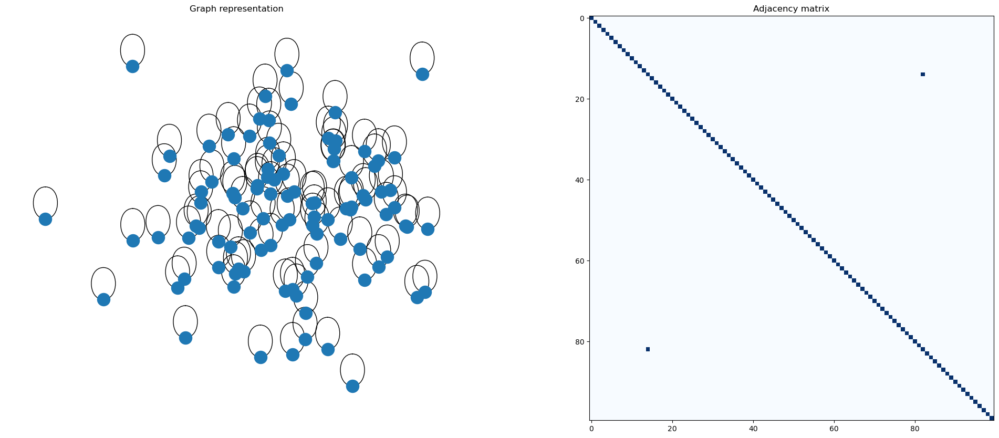

In [15]:
a, b = 10, -1000
A = P_X_Z_i_Z_j(Z, n, a, b)

plt.figure(figsize=(25,10))
plt.subplot(121)
nx.draw(nx.from_numpy_array(A), pos=Z)
plt.title('Graph representation')

plt.subplot(122)
plt.imshow(A, cmap='Blues')
plt.title('Adjacency matrix')
plt.show()


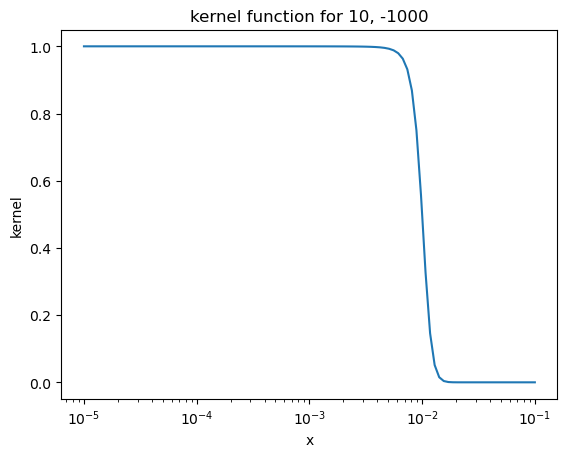

In [16]:
xx = np.logspace(-5,-1,100)
y = [kernel(a, b, 0, x) for x in xx]

plt.plot(xx,y)
plt.xscale('log')
plt.xlabel('x')
plt.ylabel('kernel')
plt.title('kernel function for 10, -1000')
plt.show()

We take a = 10, b = -1000 (b remained unchanged). There are just self loops but this time all nodes have self loops. This is because for them p=expit(10) which is close to 1.

Let's take some values that will give link betweens nodes and study the ration -a/b.

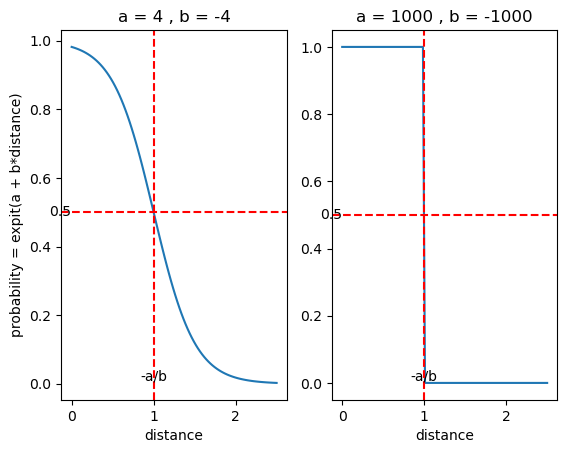

In [17]:
a = 4
b = -4
d = np.linspace(0, 2.5, 100)


plt.subplot(1, 2, 1)
plt.plot(d, scipy.special.expit(a + b*d))
plt.axhline(y=0.5, color='r', linestyle='--')
plt.text(0, 0.5, '0.5', ha='right', va='center')
plt.axvline(x=-a/b, color='r', linestyle='--')
plt.text(-a/b, 0, '-a/b', ha='center', va='bottom')
plt.xlabel('distance')
plt.ylabel('probability = expit(a + b*distance)')
plt.title(f'a = {a} , b = {b}')

a = 1000
b = -1000
plt.subplot(1, 2, 2)
plt.plot(d, scipy.special.expit(a + b*d))
plt.axhline(y=0.5, color='r', linestyle='--')
plt.text(0, 0.5, '0.5', ha='right', va='center')
plt.axvline(x=-a/b, color='r', linestyle='--')
plt.text(-a/b, 0, '-a/b', ha='center', va='bottom')
plt.xlabel('distance')
plt.title(f'a = {a} , b = {b}')
plt.show()

We see that we have the same -a/b=1, thus the transition between a high and low probability (p = expit(a+b*distance)) will occur .

However the transition is smoother with small |a| and |b| (in our example a = 4 and b = -4).

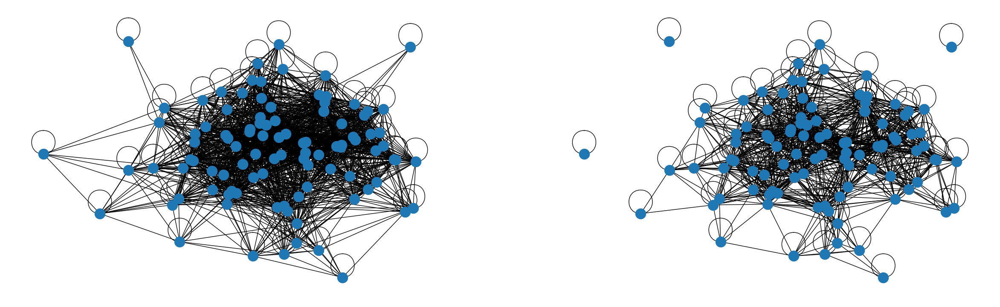

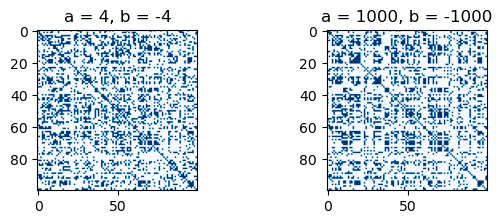

In [18]:
a1, b1 = 4, -4
a2, b2 = 1000, -1000

A1 = P_X_Z_i_Z_j(Z, n, a1, b1)
A2 = P_X_Z_i_Z_j(Z, n, a2, b2)

plt.figure(figsize=(30,20))
plt.subplot(2, 2, 1)
nx.draw(nx.from_numpy_array(A1), pos=Z)


plt.subplot(2, 2, 2)
nx.draw(nx.from_numpy_array(A2), pos=Z)
plt.show()

plt.subplot(2, 2, 3)
plt.imshow(A1, cmap='Blues')
plt.title(f'a = {a1}, b = {b1}')
# center the subplots
plt.subplots_adjust(left=0.125, bottom=0.1, right=0.9, top=0.9,
                wspace=0.4, hspace=0.4)

plt.subplot(2, 2, 4)
plt.imshow(A2, cmap='Blues')
plt.title(f'a = {a2}, b = {b2}')
plt.show()

We want to visualize the difference that we saw previously on the expit(a+b*distance) plots. 

On the adjacency matrix representation we don't see well the phenomenon (a bit with the sparsity) but it's clear on the graph plots. 

On the right graph when the nodes are close there is systematically a link. On the left one, it is more random. For example the edge on the left is connected despite it is far away from the others. This is a good illustration to have a soft/hard transition to generate your random graph.

### SBM

This is the last model to generate random graph based on a latent variable. The model can also be used to infer the latent variable from a graph (with the that the graph in question is been modeled by a SBM).

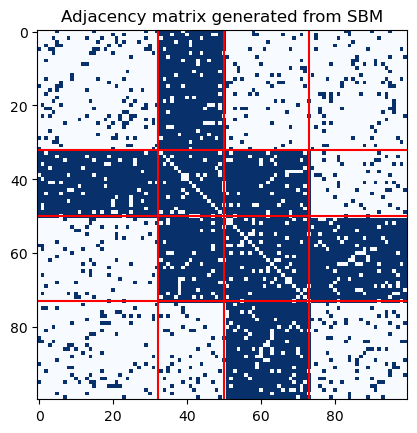

In [19]:

n=100
d=4
pi_sim = [1/d]*d
alpha_sim = [
    [0.1, 0.9, 0.1, 0.1],
    [0.9, 0.9, 0.9, 0.1],
    [0.1, 0.9, 0.9, 0.9],
    [0.1, 0.1, 0.9, 0.1]]

Z = np.random.multinomial(1, pi_sim, size=n)

rng = np.random.default_rng()

X = np.zeros((n,n))
for i in range(n):
    for j in range(i+1,n):
        p = Z[i,:]@alpha_sim@Z[j,:].T
        X[i,j] = rng.binomial(1, p)
        X[j,i] = X[i,j]


order = np.argsort(np.argmax(Z, axis=1))
Z_ordered = Z[order,:]
X_ordered = X[order,:][:,order]


plt.figure()
plt.imshow(X_ordered, cmap='Blues')

for i in range(0,d-1):
    plt.axhline(np.where(np.argmax(Z_ordered, axis=1)==i)[0][-1], color='r')
    plt.axvline(np.where(np.argmax(Z_ordered, axis=1)==i)[0][-1], color='r')
plt.title("Adjacency matrix generated from SBM")
plt.show()


There are number of latent variable (d) they each represent a block. The size of a block (number of nodes inside) is determined by pi (here pi is use as a parameter of a multinomial and pi is uniform). The probability of link between 2 nodes is depends on their block and a matrix alpha. 
a node from block i and a node from block j have the `p=alpha[i,j]` probability to be linked.

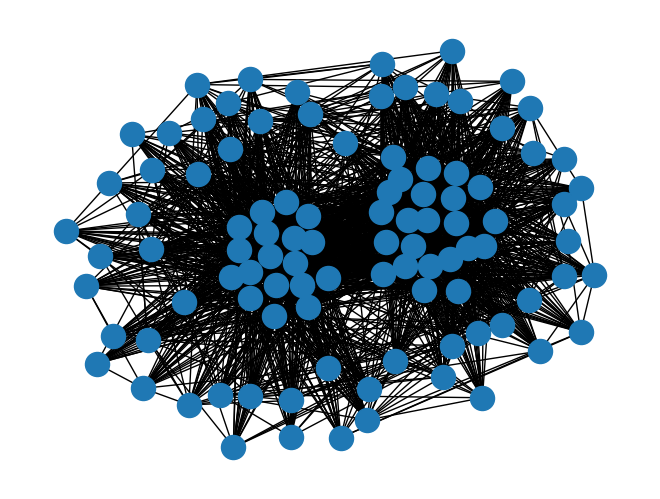

In [20]:
import networkx as nx
nx.draw(nx.from_numpy_array(X))

We retrieve a graph from part 1.

Now let suppose we have this graph and we want to infer the latent variable. For that we use EM algorithm. 


We initialize the latent variable with a random assignment. Then we compute the probability of each node to be in a block. We update the latent variable with the most probable block. We iterate until convergence.

In [21]:
def alpha_hat(tau, X):
    return (tau.T@X@tau)/(tau.T@np.ones_like(X)@tau)

def pi_hat(tau):
    return tau.mean(axis=0)

def h(tau, X, alpha, pi):
    return np.log(pi) + X @ tau @ np.log(alpha.T) + (1-X)@tau@np.log(1-alpha.T)

def tau_hat(tau, X, alpha, pi):
    return np.exp(h(tau, X, alpha, pi)) / np.exp(h(tau, X, alpha, pi)).sum(axis=1)[:,np.newaxis]

def J(tau, X, alpha, pi):    
    return -np.sum(tau * np.log(tau)) + np.sum(tau.T@X@tau * np.log(alpha) + tau.T@(1-X)@tau * np.log(1-alpha)) + np.sum(tau*np.log(pi))

Estimator functions.

In [22]:
from sklearn.cluster import KMeans
def SC(M, k):
    L = np.diag(np.sum(M, axis=0)) - M
    _, eigvect = np.linalg.eigh(L)
    U = eigvect[:, :k]
    kmeans = KMeans(n_clusters=k, random_state=0, n_init=10).fit(U)
    return kmeans.labels_

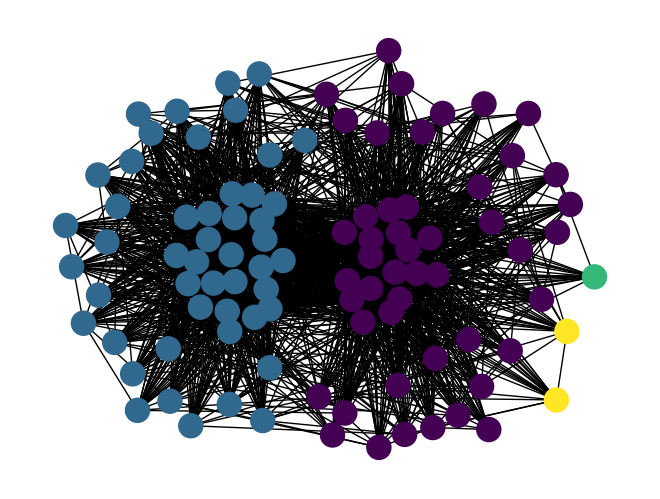

In [23]:
labels = SC(X,d)
nx.draw(nx.from_numpy_array(X), node_color=labels)
plt.show()

In [24]:
max_steps = 100000

J_hist, alpha_hist, tau_hist, pi_hist = [], [], [], []

# tau initialization
tau = np.eye(d)[SC(X,d)]
epsilon = 1/(2*d)
tau = (tau+epsilon)/(1+d*epsilon)

# M step
pi = pi_hat(tau)
alpha = alpha_hat(tau, X)

tau_hist.append(tau)
pi_hist.append(pi)
alpha_hist.append(alpha)
J_hist.append(J(tau, X, alpha, pi))


for i in range(max_steps):
    # E step
    tau = tau_hat(tau, X, alpha, pi)
    tau_hist.append(tau)
    J_hist.append(J(tau, X, alpha, pi))

    # M step
    pi = pi_hat(tau)
    alpha = alpha_hat(tau, X)
    pi_hist.append(pi)
    alpha_hist.append(alpha)
    J_hist.append(J(tau, X, alpha, pi))
    
    if i >=2 and np.abs(J_hist[-1] - J_hist[-2]) < 1e-6:
        break


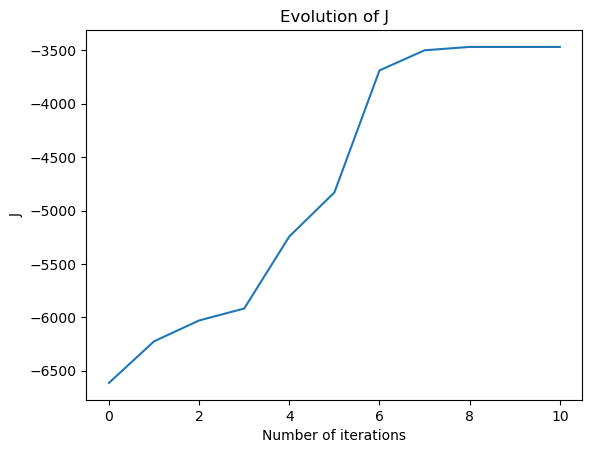

In [25]:
plt.figure()
plt.plot(range(len(J_hist)), J_hist)
plt.xlabel('Number of iterations')
plt.ylabel('J')
plt.title('Evolution of J')
plt.show()

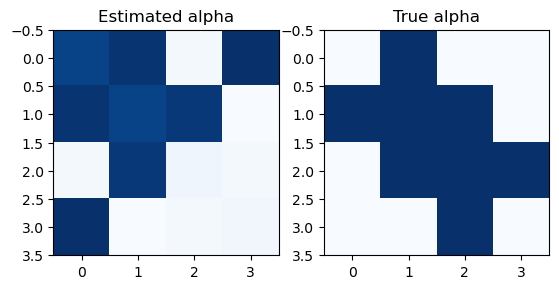

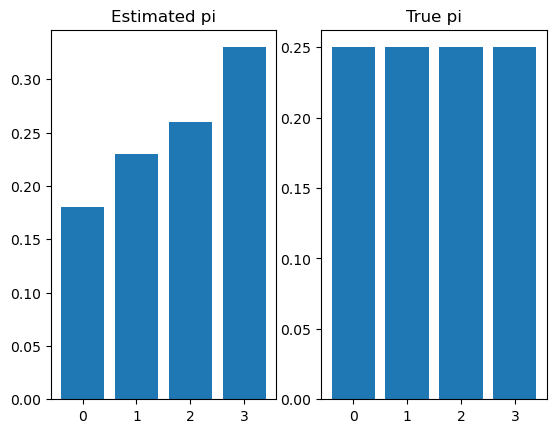

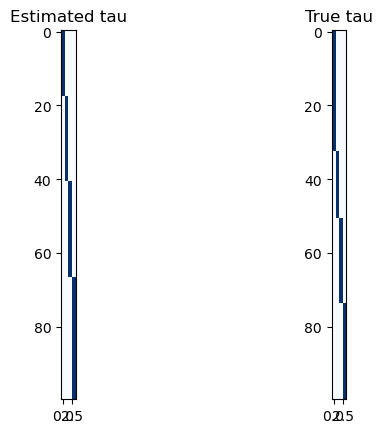

In [26]:
# making 2 subplots comparing alpha and alpha_sim
fig, (ax1, ax2) = plt.subplots(1, 2)
ax1.imshow(alpha, cmap='Blues')
ax1.set_title("Estimated alpha")
ax2.imshow(alpha_sim, cmap='Blues')
ax2.set_title("True alpha")
plt.show()

# same for pi
fig, (ax1, ax2) = plt.subplots(1, 2)
ax1.bar(range(d), pi)
ax1.set_title("Estimated pi")
ax2.bar(range(d), pi_sim)
ax2.set_title("True pi")
plt.show()

# same for tau
order = np.argsort(np.argmax(tau, axis=1))
tau_ordered = tau[order,:]
fig, (ax1, ax2) = plt.subplots(1, 2)
ax1.imshow(tau_ordered, cmap='Blues')
ax1.set_title("Estimated tau")
ax2.imshow(Z_ordered, cmap='Blues')
ax2.set_title("True tau")
plt.show()

We see that the parameter are well estimated and quite rapidly this is caused by the tau initialization with SC (that do already a good job).

To stop the estimation it is when the function to optimize J has reached a plateau. We can see that the function is increasing () and then reach a plateau. We can also stop with a max iteration.